# Import and installing

In [1]:
import numpy as np 
import pandas as pd 
import matplotlib.pyplot as plt
import os

from PIL import Image
from skimage import exposure
from skimage.filters import gaussian, laplace, median, scharr
from skimage.feature import canny
from skimage.color.adapt_rgb import adapt_rgb, hsv_value
from constants import TRAIN_IMAGES_PATH, TEST_IMAGES_PATH, SAMPLES_SHIPS
from useful_functions import create_mask

C:\Users\danie_eqscsl0\AppData\Local\Temp\ipykernel_12412\798499820.py:2: DeprecationWarning: 
Pyarrow will become a required dependency of pandas in the next major release of pandas (pandas 3.0),
(to allow more performant data types, such as the Arrow string type, and better interoperability with other libraries)
but was not found to be installed on your system.
If this would cause problems for you,
please provide us feedback at https://github.com/pandas-dev/pandas/issues/54466
        
  import pandas as pd


In [2]:
DATA_FOLDER_PATH = 'airbus-ship-detection'

In [3]:
df = pd.read_csv(os.path.join(DATA_FOLDER_PATH, 'train_ship_segmentations_v2.csv'))
df.head()

,ImageId,EncodedPixels
0,00003e153.jpg,NaN
1,0001124c7.jpg,NaN
2,000155de5.jpg,264661 17 265429 33 266197 33 266965 33 267733...
3,000194a2d.jpg,360486 1 361252 4 362019 5 362785 8 363552 10 ...
4,000194a2d.jpg,51834 9 52602 9 53370 9 54138 9 54906 9 55674 ...


We can see that some of our data has NaN EncodedPixels, which could be a sign of unbalanced classes.

# EDA

In [4]:
train_files = os.listdir(TRAIN_IMAGES_PATH)
test_files = os.listdir(TEST_IMAGES_PATH)

print(f"Train files: {len(train_files)}.")
print(f"Test files :  {len(test_files)}.")

Train files: 192556.
Test files :  15606.


So, we have too big train data set. So we have to cut it and select a certain part to reduce the computation time considering the limited computing power.

In [5]:
not_empty = pd.notna(df['EncodedPixels'])
print(not_empty.sum(), 'Masks in', df[not_empty].ImageId.nunique(), 'images')
print((~not_empty).sum(), 'Empty images in', df.ImageId.nunique(), 'total images')

81723 Masks in 42556 images
150000 Empty images in 192556 total images


In [6]:
df['Has_Ship'] = df['EncodedPixels'].apply(lambda x: 0 if pd.isna(x) else 1)
df.head()

,ImageId,EncodedPixels,Has_Ship
0,00003e153.jpg,NaN,0
1,0001124c7.jpg,NaN,0
2,000155de5.jpg,264661 17 265429 33 266197 33 266965 33 267733...,1
3,000194a2d.jpg,360486 1 361252 4 362019 5 362785 8 363552 10 ...,1
4,000194a2d.jpg,51834 9 52602 9 53370 9 54138 9 54906 9 55674 ...,1


In [7]:
df['Has_Ship'].value_counts()

Has_Ship
0    150000
1     81723
Name: count, dtype: int64

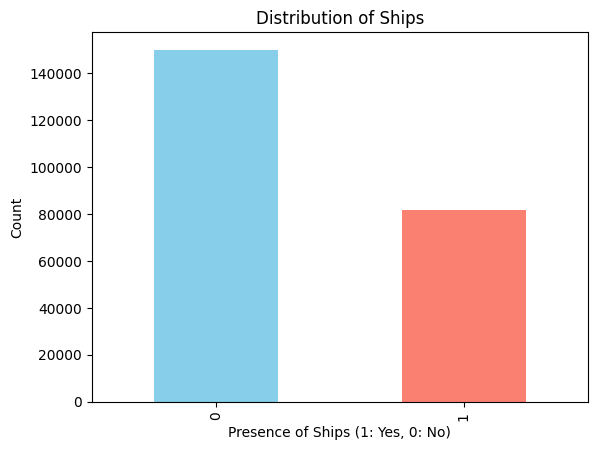

In [8]:
ship_counts = df['Has_Ship'].value_counts()

# Plotting the histogram
ship_counts.plot(kind='bar', color=['skyblue', 'salmon'])

# Adding labels and title
plt.title('Distribution of Ships')
plt.xlabel('Presence of Ships (1: Yes, 0: No)')
plt.ylabel('Count')

# Display the plot
plt.show()

In [9]:
df['Ships'] = df['EncodedPixels'].map(lambda c_row: 1 if isinstance(c_row, str) else 0) #looking for several ships in one image
df.head()

,ImageId,EncodedPixels,Has_Ship,Ships
0,00003e153.jpg,NaN,0,0
1,0001124c7.jpg,NaN,0,0
2,000155de5.jpg,264661 17 265429 33 266197 33 266965 33 267733...,1,1
3,000194a2d.jpg,360486 1 361252 4 362019 5 362785 8 363552 10 ...,1,1
4,000194a2d.jpg,51834 9 52602 9 53370 9 54138 9 54906 9 55674 ...,1,1


In [10]:
grouped_df = df.groupby(['ImageId']).agg({'Ships': 'sum'}).reset_index() #find the number of ships for each image
grouped_df.head()

,ImageId,Ships
0,00003e153.jpg,0
1,0001124c7.jpg,0
2,000155de5.jpg,1
3,000194a2d.jpg,5
4,0001b1832.jpg,0


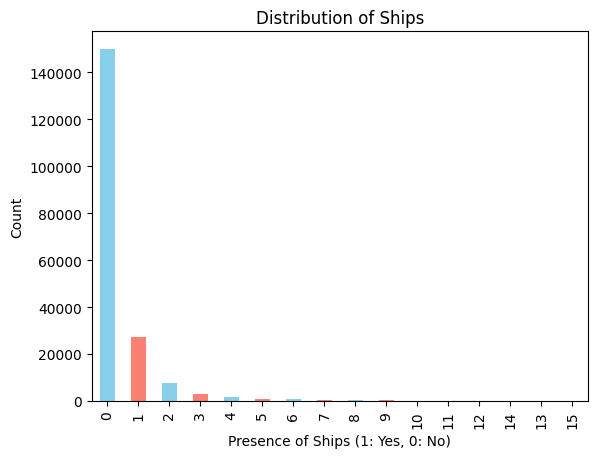

In [11]:
ship_counts = grouped_df['Ships'].value_counts()

# Plotting the histogram
ship_counts.plot(kind='bar', color=['skyblue', 'salmon'])

# Adding labels and title
plt.title('Distribution of Ships')
plt.xlabel('Presence of Ships (1: Yes, 0: No)')
plt.ylabel('Count')

# Display the plot
plt.show()

In [12]:
grouped_df['Ships'].describe()

count    192556.000000
mean          0.424412
std           1.199094
min           0.000000
25%           0.000000
50%           0.000000
75%           0.000000
max          15.000000
Name: Ships, dtype: float64

In [13]:
print(grouped_df['Ships'].value_counts())

Ships
0     150000
1      27104
2       7674
3       2954
4       1622
5        925
6        657
7        406
8        318
9        243
10       168
11       144
12       124
14        76
13        75
15        66
Name: count, dtype: int64


**We can draw a first conclusion: we have a high level of class imbalance, because most of our dataset(mean = 0.42) is just water without any ships, there is also a group of images that contain more than 2-3 ships, and this may become a problem in future modeling. since they are a minority and may not be taken into account by the model.**

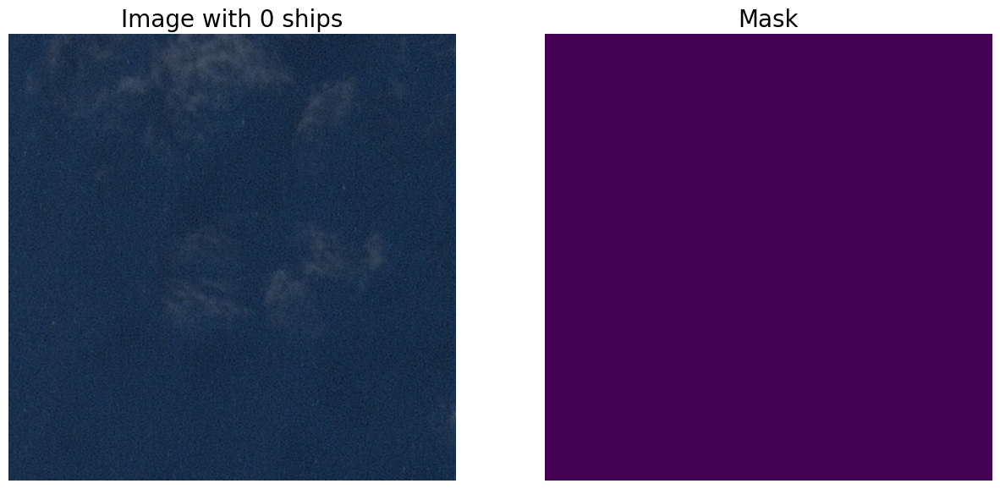

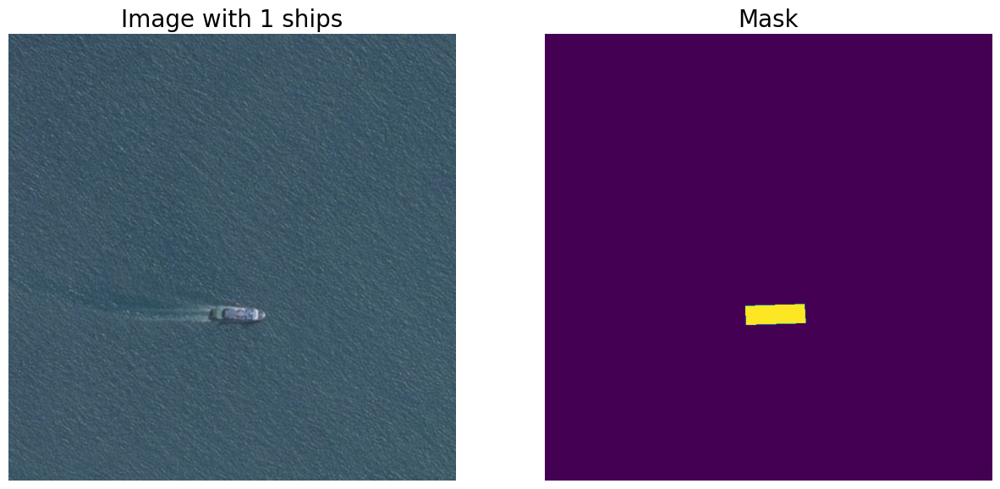

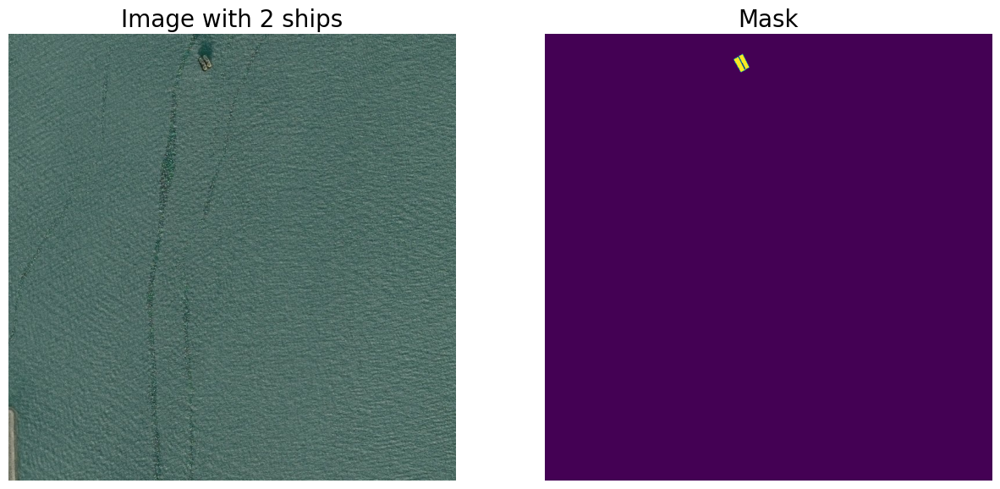

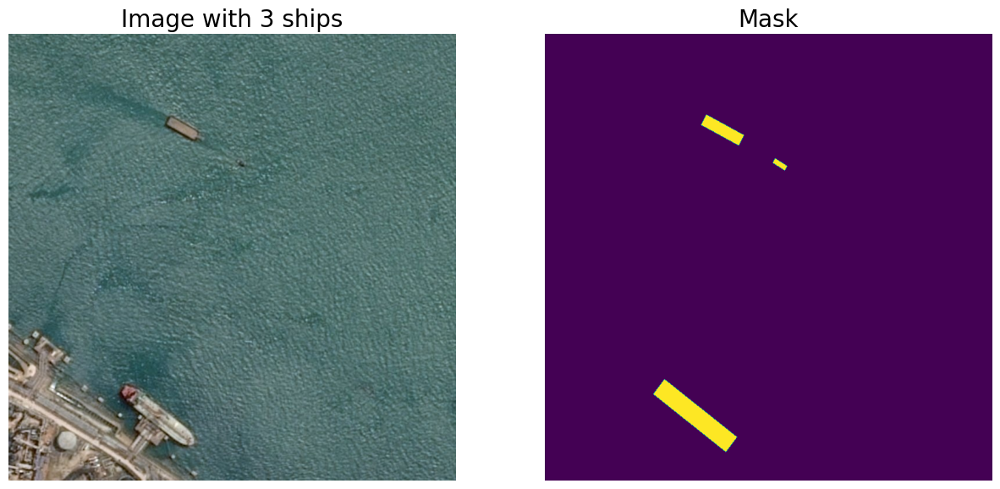

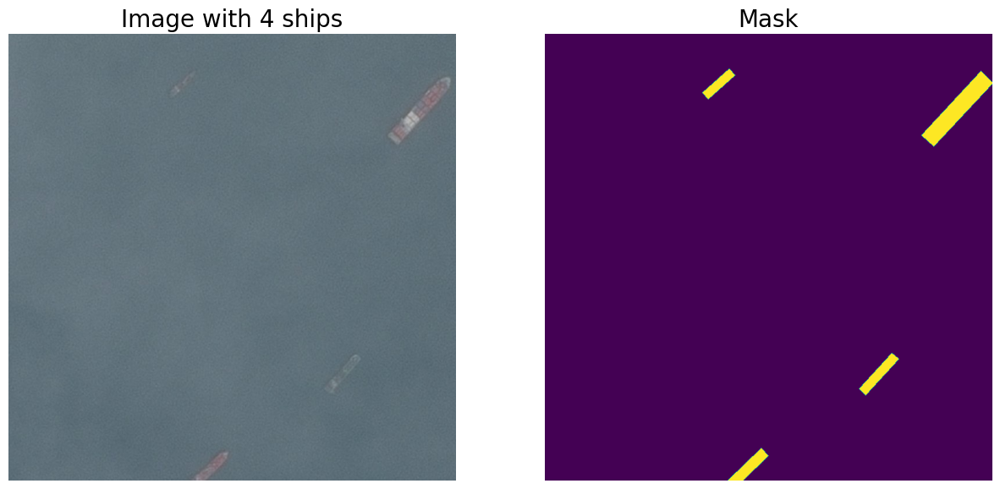

...

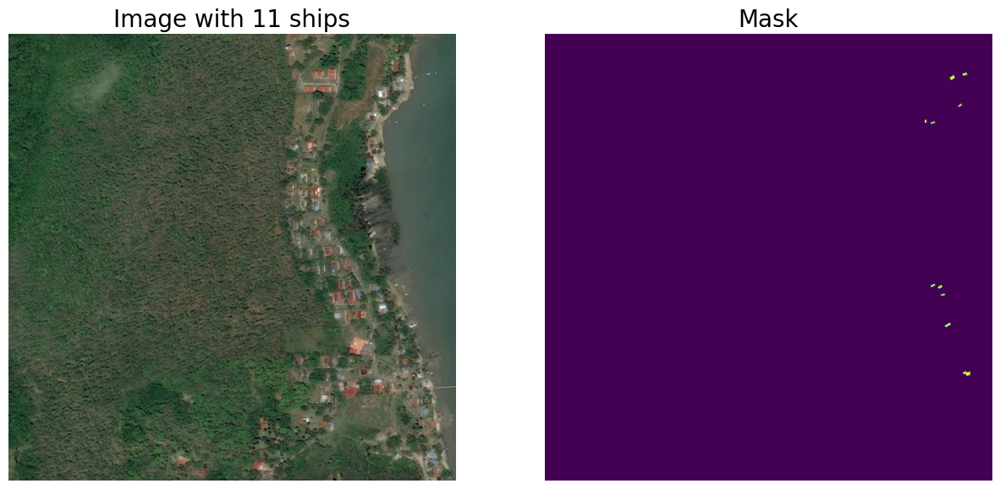

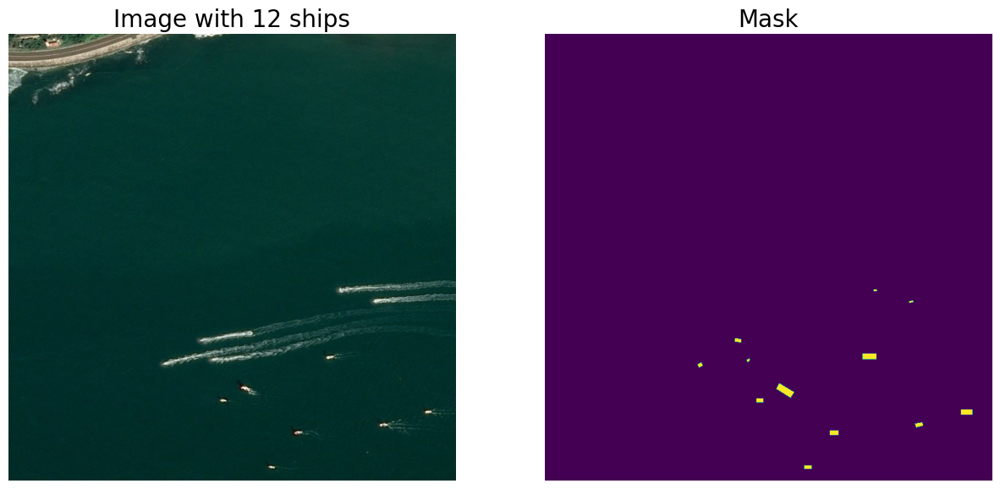

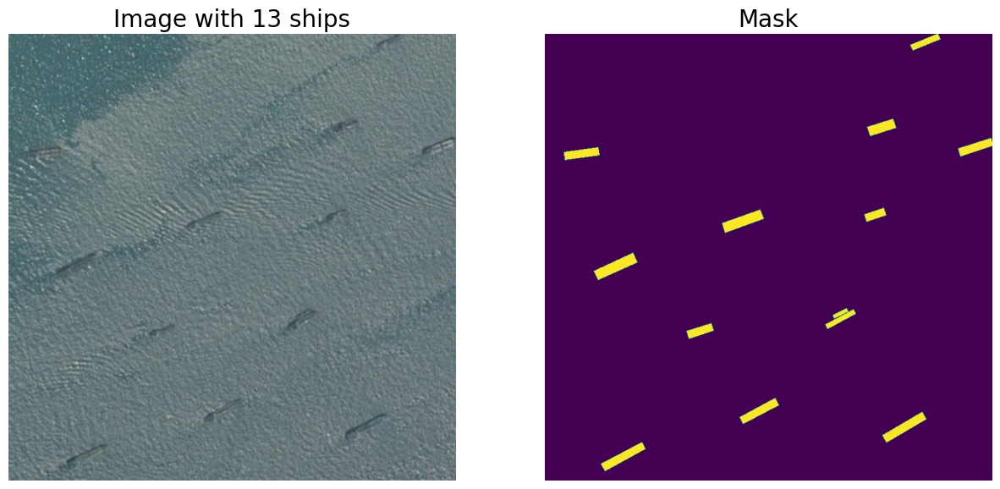

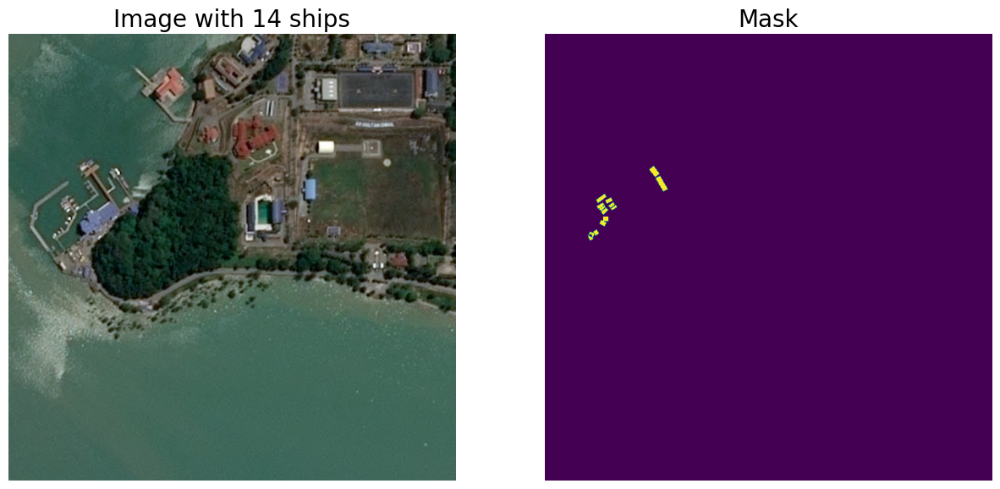

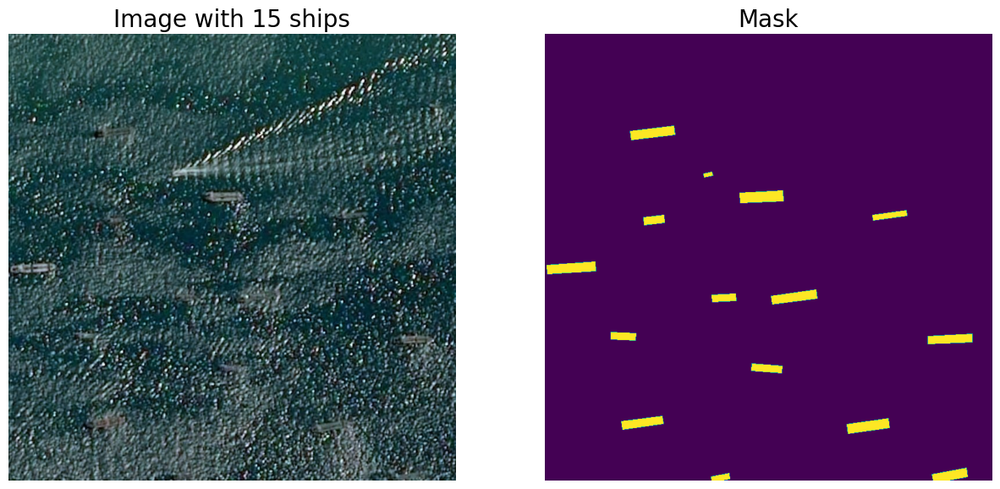

In [14]:
for i in range(grouped_df['Ships'].nunique()):
    img_name = grouped_df['ImageId'].loc[grouped_df['Ships'] == i].values[0]
    image = Image.open(os.path.join(TRAIN_IMAGES_PATH, img_name))
    masks = df['EncodedPixels'][df['ImageId'] == img_name].to_list()
    segm_masks = create_mask(masks)
    
    fig, (ax1, ax2) = plt.subplots(1, 2, figsize = (15, 10))
    ax1.axis('off')
    ax2.axis('off')
    ax1.imshow(image)
    ax1.set_title(f'Image with {i} ships', fontsize = 20)
    
    ax2.imshow(segm_masks)
    ax2.set_title('Mask', fontsize = 20)

Let's take a look at images with different sizes

In [15]:
grouped_df['image_size'] = grouped_df['ImageId'].map(lambda c_img_id: os.stat(os.path.join(TRAIN_IMAGES_PATH, c_img_id)).st_size / 1024)

<Axes: >

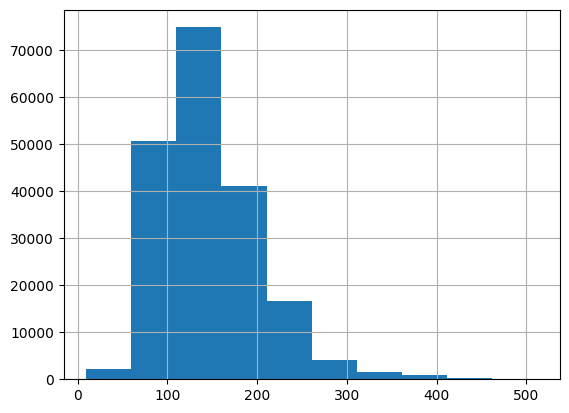

In [16]:
grouped_df['image_size'].hist()

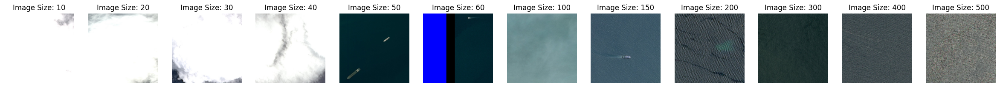

In [17]:
sizes = [10, 20, 30, 40, 50, 60, 100, 150, 200, 300, 400, 500] # Sizes ranging from 10 to 500
# Display images
fig, axs = plt.subplots(1, len(sizes), figsize=(30, 30))

# Now, let's visualize these images
for i, size in enumerate(sizes):
    img_name = grouped_df['ImageId'].loc[(grouped_df['image_size'] < size + 5) & (grouped_df['image_size'] > size - 5)].values[0]
    image = Image.open(os.path.join(TRAIN_IMAGES_PATH, img_name))
    axs[i].imshow(image)
    axs[i].set_title(f"Image Size: {size}")
    axs[i].axis('off')
    
plt.show()

**We can conclude that many images with a small size have poor quality in the majority, so it is necessary to crop and choose larger than a certain value**

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


(-0.5, 767.5, 767.5, -0.5)

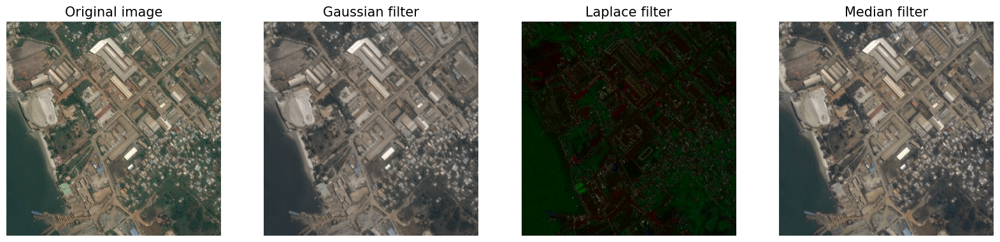

In [18]:
img_name = grouped_df['ImageId'].loc[grouped_df['Ships'] == 9].values[0] # choosing random image

img = Image.open(os.path.join(TRAIN_IMAGES_PATH, img_name))
img = np.asarray(img)
# Gaussian filter
img_gaus = gaussian(img)

# Laplace filter
img_lapl = laplace(img)

# Median filter
img_median = median(img)

fig, (ax1, ax2, ax3, ax4)= plt.subplots(1, 4, figsize = (20, 20))

ax1.imshow(img)
ax1.set_title('Original image', fontsize = 15)
ax1.axis('off')

ax2.imshow(img_gaus)
ax2.set_title('Gaussian filter', fontsize = 15)
ax2.axis('off')

ax3.imshow(img_lapl)
ax3.set_title('Laplace filter', fontsize = 15)
ax3.axis('off')

ax4.imshow(img_median)
ax4.set_title('Median filter', fontsize = 15)
ax4.axis('off')

This filters don't give a good result, so let's experiment with other approaches.

(-0.5, 767.5, 767.5, -0.5)

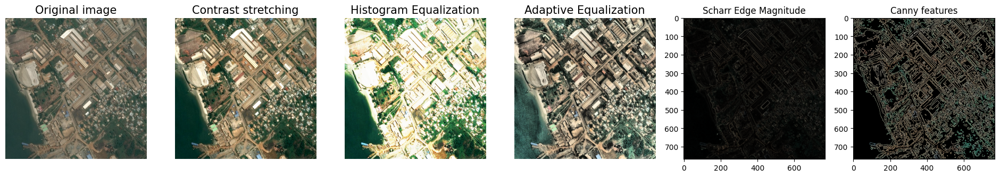

In [19]:
#good idea to experiment with different approaches to feature development

@adapt_rgb(hsv_value)
def canny_hsv(image):
    return canny(image)

@adapt_rgb(hsv_value)
def scharr_hsv(image):
    return scharr(image)

p2, p98 = np.percentile(img, (2, 98))
img_rescale = exposure.rescale_intensity(img, in_range=(p2, p98))

# Histogram Equalization
masks = df['EncodedPixels'].loc[df['ImageId'] == img_name].to_list()
mask = create_mask(masks)
img_eq = exposure.equalize_hist(img, mask=mask)

# Adaptive Equalization
img_adapteq = exposure.equalize_adapthist(img, clip_limit=0.05)

# Scharr Edge Magnitude
edge_scharr = scharr_hsv(img)

# Canny features
edge_canny = canny_hsv(img)

fig, (ax1, ax2, ax3, ax4, ax5, ax6)= plt.subplots(1, 6, figsize = (24, 24))

ax1.imshow(img)
ax1.set_title('Original image', fontsize=15)
ax1.axis('off')

ax2.imshow(img_rescale)
ax2.set_title('Contrast stretching', fontsize=15)
ax2.axis('off')

ax3.imshow(img_eq)
ax3.set_title('Histogram Equalization', fontsize=15)
ax3.axis('off')

ax4.imshow(img_adapteq)
ax4.set_title('Adaptive Equalization', fontsize=15)
ax4.axis('off')

ax5.imshow(edge_scharr, cmap = 'binary')
ax5.set_title('Scharr Edge Magnitude')
ax4.axis('off')


ax6.imshow(edge_canny, cmap = 'binary')
ax6.set_title('Canny features')
ax4.axis('off')


**We can use contrast stretching to improve image quality. In fact, these filters did not provide a significant increase in score**

# Pre-Processing

In [21]:
grouped_df = grouped_df[grouped_df['image_size'] > 50]
grouped_df.head()

,ImageId,Ships,image_size
0,00003e153.jpg,0,128.944336
1,0001124c7.jpg,0,76.059570
2,000155de5.jpg,1,147.625977
3,000194a2d.jpg,5,75.221680
4,0001b1832.jpg,0,95.627930


C:\Users\danie_eqscsl0\AppData\Local\Temp\ipykernel_12412\2426860527.py:1: DeprecationWarning: DataFrameGroupBy.apply operated on the grouping columns. This behavior is deprecated, and in a future version of pandas the grouping columns will be excluded from the operation. Either pass `include_groups=False` to exclude the groupings or explicitly select the grouping columns after groupby to silence this warning.
  balanced_train_df = grouped_df.groupby('Ships').apply(lambda x: x.sample(SAMPLES_SHIPS) if len(x) > SAMPLES_SHIPS else x)


<Axes: >

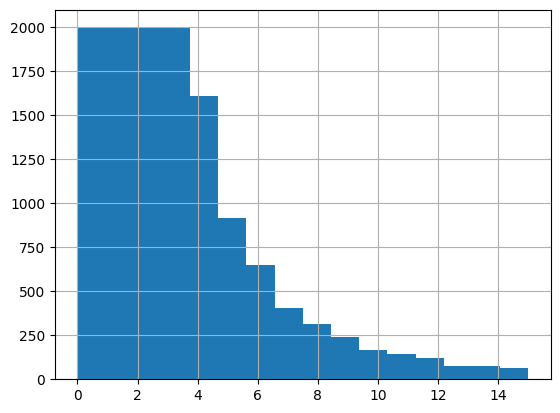

In [22]:
balanced_train_df = grouped_df.groupby('Ships').apply(lambda x: x.sample(SAMPLES_SHIPS) if len(x) > SAMPLES_SHIPS else x)

balanced_train_df['Ships'].hist(bins = balanced_train_df['Ships'].max() + 1)

In [25]:
df = df.drop(['Ships', 'Has_Ship'], axis=1)

In [27]:
#saving results for data generators

balanced_train_df.to_csv('pretrain_set.csv', index=False)
df.to_csv('masks.csv', index=False)